In [1]:
import pandas as pd
import numpy as np
import datetime
import warnings
import re
from sklearn.linear_model import LinearRegression

warnings.filterwarnings('ignore')
warnings.filterwarnings("ignore", message="numpy.ufunc size changed")

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

pd.set_option('display.max_columns', None)

In [3]:
df = pd.read_csv('we_fn_use_c_marketing_customer_value_analysis.csv')
df.columns

Index(['Customer', 'State', 'Customer Lifetime Value', 'Response', 'Coverage',
       'Education', 'Effective To Date', 'EmploymentStatus', 'Gender',
       'Income', 'Location Code', 'Marital Status', 'Monthly Premium Auto',
       'Months Since Last Claim', 'Months Since Policy Inception',
       'Number of Open Complaints', 'Number of Policies', 'Policy Type',
       'Policy', 'Renew Offer Type', 'Sales Channel', 'Total Claim Amount',
       'Vehicle Class', 'Vehicle Size'],
      dtype='object')

In [4]:
column_mapping = {col: col.lower().replace(' ', '_') for col in df.columns}
df.rename(columns=column_mapping, inplace=True)

In [6]:
df = df.drop('customer', axis=1)

In [7]:
df.transpose()

0              1              2     \
state                              Washington        Arizona         Nevada   
customer_lifetime_value           2763.519279    6979.535903    12887.43165   
response                                   No             No             No   
coverage                                Basic       Extended        Premium   
education                            Bachelor       Bachelor       Bachelor   
effective_to_date                     2/24/11        1/31/11        2/19/11   
employmentstatus                     Employed     Unemployed       Employed   
gender                                      F              F              F   
income                                  56274              0          48767   
location_code                        Suburban       Suburban       Suburban   
marital_status                        Married         Single        Married   
monthly_premium_auto                       69             94            108   
months_since_last_claim                    32             13             18   
months_since_policy_inception               5             42             38   
number_of_open_complaints                   0              0              0   
number_of_policies                          1              8              2   
policy_type                    Corporate Auto  Personal Auto  Personal Auto   
policy                           Corporate L3    Personal L3    Personal L3   
renew_offer_type                       Offer1         Offer3         Offer1   
sales_channel                           Agent          Agent          Agent   
total_claim_amount                 384.811147    1131.464935     566.472247   
vehicle_class                    Two-Door Car  Four-Door Car   Two-Door Car   
vehicle_size                          Medsize        Medsize        Medsize   

                                         3              4              5     \
state                              California     Washington         Oregon   
customer_lifetime_value           7645.861827    2813.692575      8256.2978   
response                                   No             No            Yes   
coverage                                Basic          Basic          Basic   
education                            Bachelor       Bachelor       Bachelor   
effective_to_date                     1/20/11         2/3/11        1/25/11   
employmentstatus                   Unemployed       Employed       Employed   
gender                                      M              M              F   
income                                      0          43836          62902   
location_code                        Suburban          Rural          Rural   
marital_status                        Married         Single        Married   
monthly_premium_auto                      106             73             69   
months_since_last_claim                    18             12             14   
months_since_policy_inception              65             44             94   
number_of_open_complaints                   0              0              0   
number_of_policies                          7              1              2   
policy_type                    Corporate Auto  Personal Auto  Personal Auto   
policy                           Corporate L2    Personal L1    Personal L3   
renew_offer_type                       Offer1         Offer1         Offer2   
sales_channel                     Call Center          Agent            Web   
total_claim_amount                 529.881344     138.130879     159.383042   
vehicle_class                             SUV  Four-Door Car   Two-Door Car   
vehicle_size                          Medsize        Medsize        Medsize   

                                         6               7               8     \
state                                  Oregon         Arizona          Oregon   
customer_lifetime_value           5380.898636     7216.100311     24127.50402   
resp

In [9]:
df['number_of_open_complaints'] = df['number_of_open_complaints'].astype('object')

df['number_of_policies'] = df['number_of_policies'].astype('object')

In [11]:
categoricals = df.select_dtypes(include='object')
categoricals.head()

,state,response,coverage,education,effective_to_date,employmentstatus,gender,location_code,marital_status,number_of_open_complaints,number_of_policies,policy_type,policy,renew_offer_type,sales_channel,vehicle_class,vehicle_size
0,Washington,No,Basic,Bachelor,2/24/11,Employed,F,Suburban,Married,0,1,Corporate Auto,Corporate L3,Offer1,Agent,Two-Door Car,Medsize
1,Arizona,No,Extended,Bachelor,1/31/11,Unemployed,F,Suburban,Single,0,8,Personal Auto,Personal L3,Offer3,Agent,Four-Door Car,Medsize
2,Nevada,No,Premium,Bachelor,2/19/11,Employed,F,Suburban,Married,0,2,Personal Auto,Personal L3,Offer1,Agent,Two-Door Car,Medsize
3,California,No,Basic,Bachelor,1/20/11,Unemployed,M,Suburban,Married,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,SUV,Medsize
4,Washington,No,Basic,Bachelor,2/3/11,Employed,M,Rural,Single,0,1,Personal Auto,Personal L1,Offer1,Agent,Four-Door Car,Medsize


In [12]:
categoricals.columns

Index(['state', 'response', 'coverage', 'education', 'effective_to_date',
       'employmentstatus', 'gender', 'location_code', 'marital_status',
       'number_of_open_complaints', 'number_of_policies', 'policy_type',
       'policy', 'renew_offer_type', 'sales_channel', 'vehicle_class',
       'vehicle_size'],
      dtype='object')

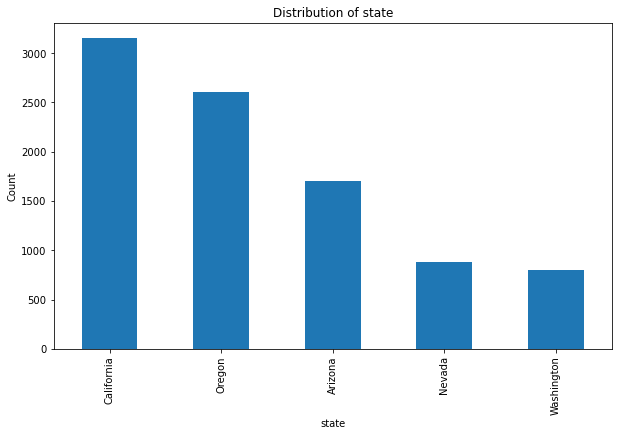

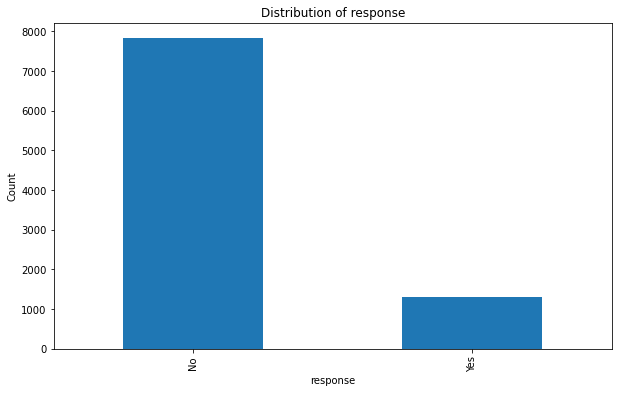

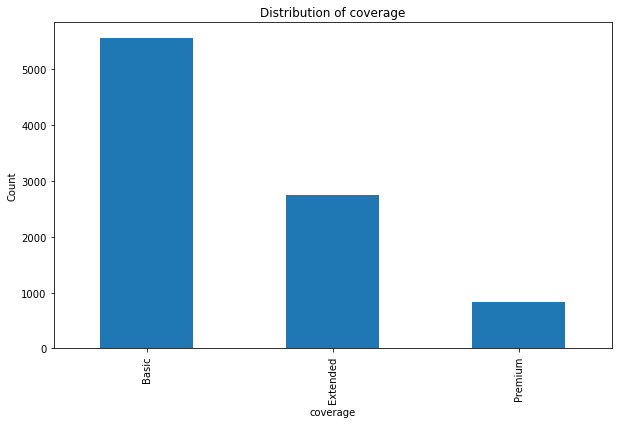

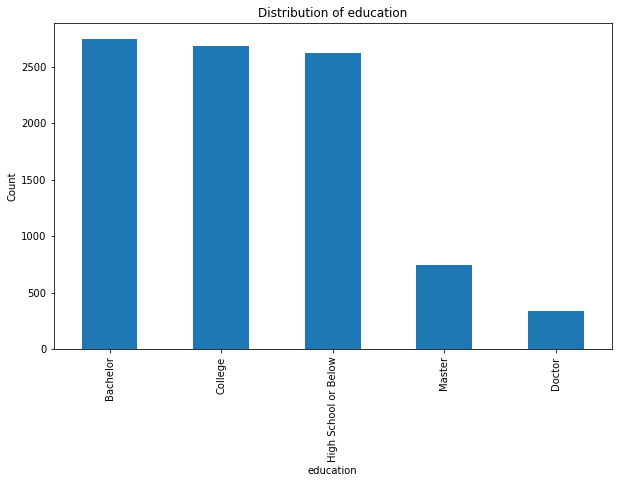

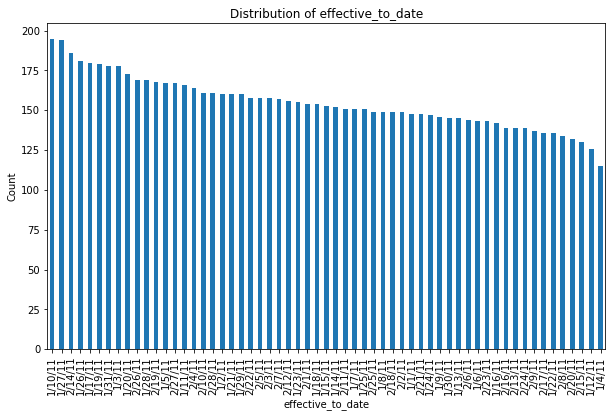

...

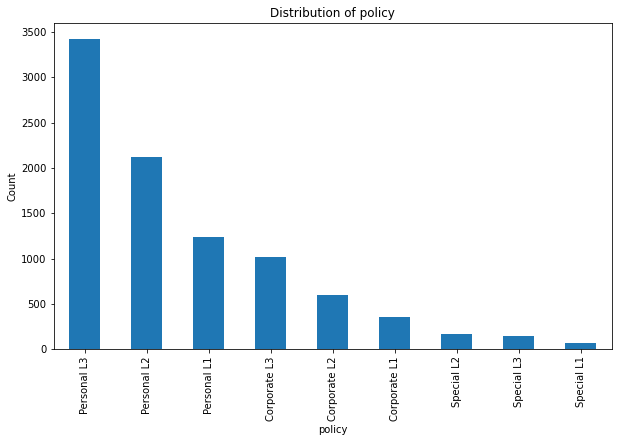

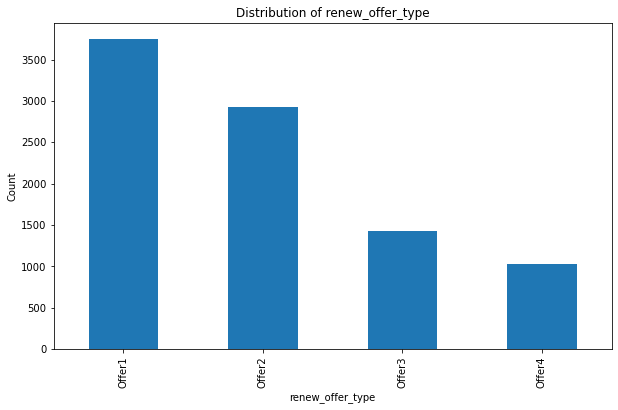

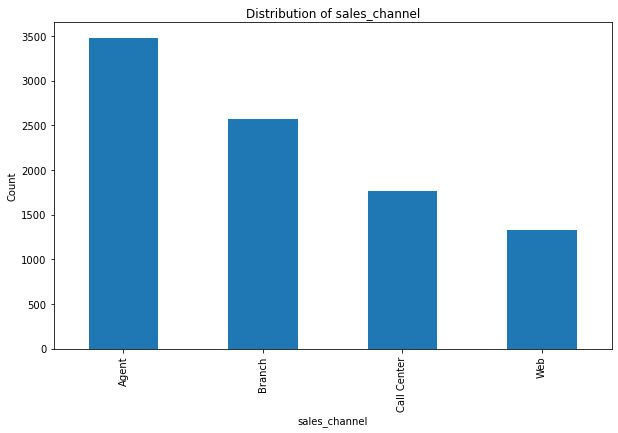

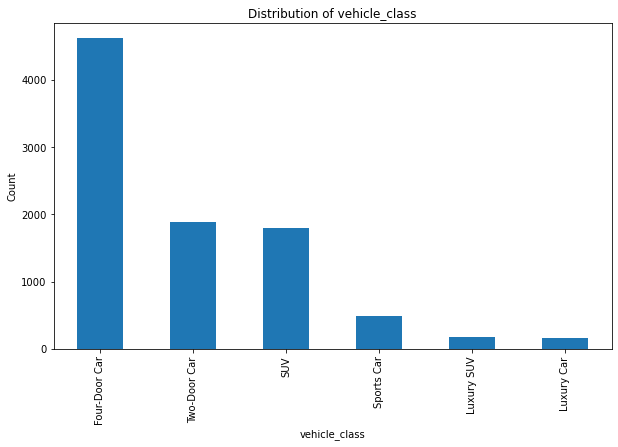

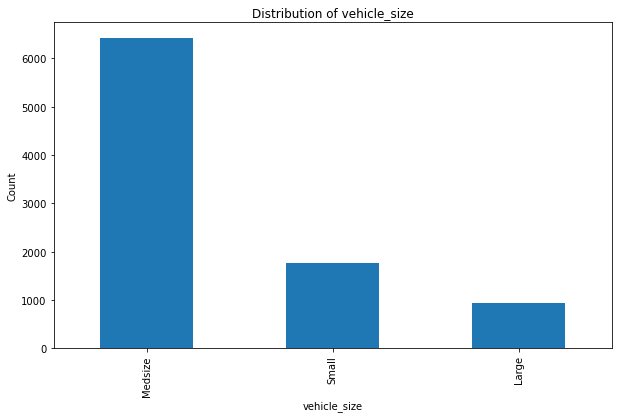

In [13]:
for column in categoricals.columns:
    plt.figure(figsize=(10, 6))
    categoricals[column].value_counts().plot(kind='bar')
    plt.title(f"Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel("Count")
    plt.show()

In [14]:
for column in categoricals.columns:
    print(f"Column: {column}")
    print(categoricals[column].value_counts())
    print()

Column: state
California    3150
Oregon        2601
Arizona       1703
Nevada         882
Washington     798
Name: state, dtype: int64

Column: response
No     7826
Yes    1308
Name: response, dtype: int64

Column: coverage
Basic       5568
Extended    2742
Premium      824
Name: coverage, dtype: int64

Column: education
Bachelor                2748
College                 2681
High School or Below    2622
Master                   741
Doctor                   342
Name: education, dtype: int64

Column: effective_to_date
1/10/11    195
1/27/11    194
2/14/11    186
1/26/11    181
1/17/11    180
1/19/11    179
1/31/11    178
1/3/11     178
1/20/11    173
2/26/11    169
1/28/11    169
2/19/11    168
1/5/11     167
2/27/11    167
1/11/11    166
2/4/11     164
2/10/11    161
2/28/11    161
1/2/11     160
1/21/11    160
1/29/11    160
2/22/11    158
2/5/11     158
2/3/11     158
2/7/11     157
2/12/11    156
1/23/11    155
2/1/11     154
1/18/11    154
1/15/11    153
1/14/11    152
2/11/11   

Column: policy_type
Personal Auto     6788
Corporate Auto    1968
Special Auto       378
Name: policy_type, dtype: int64

Column: policy
Personal L3     3426
Personal L2     2122
Personal L1     1240
Corporate L3    1014
Corporate L2     595
Corporate L1     359
Special L2       164
Special L3       148
Special L1        66
Name: policy, dtype: int64

In [15]:
3426+2122+1240

6788

In [16]:
1014+595+359

1968

In [17]:
164+148+66

378

policy_type is only the sum of policy, thus we remove policy_type

In [18]:
categoricals = categoricals.drop('policy_type', axis=1)

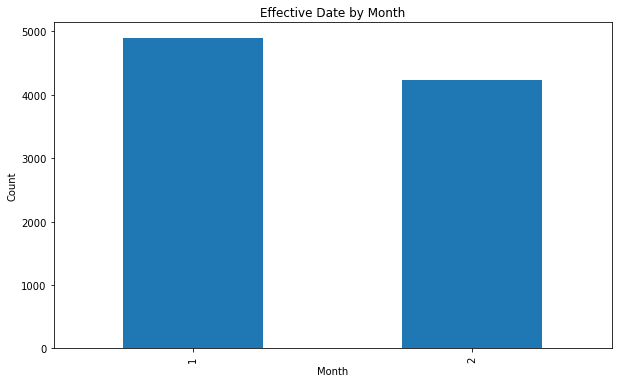

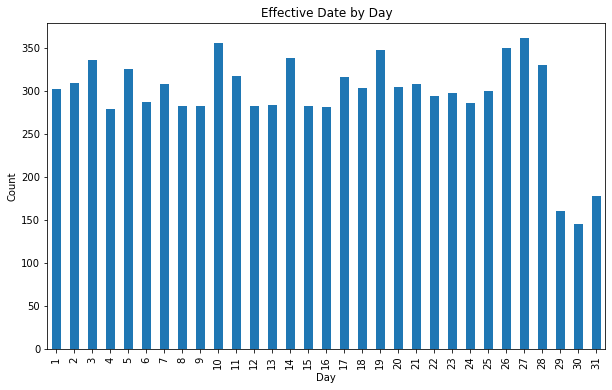

In [26]:
# Convert 'effective_to_date' column to datetime
categoricals['effective_to_date'] = pd.to_datetime(categoricals['effective_to_date'])

# Extract month, day, and year components
categoricals['month'] = categoricals['effective_to_date'].dt.month
categoricals['day'] = categoricals['effective_to_date'].dt.day
categoricals['year'] = categoricals['effective_to_date'].dt.year

# Plot 'effective_to_date' by month
plt.figure(figsize=(10, 6))
categoricals['month'].value_counts().sort_index().plot(kind='bar')
plt.xlabel('Month')
plt.ylabel('Count')
plt.title('Effective Date by Month')
plt.show()

# Plot 'effective_to_date' by day
plt.figure(figsize=(10, 6))
categoricals['day'].value_counts().sort_index().plot(kind='bar')
plt.xlabel('Day')
plt.ylabel('Count')
plt.title('Effective Date by Day')
plt.show()



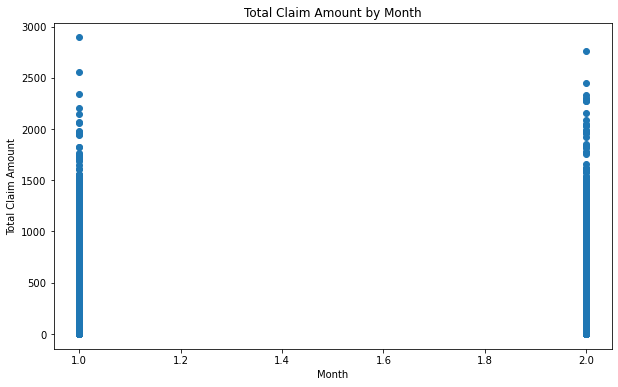

In [33]:
# Convert 'effective_to_date' column to datetime
df['effective_to_date'] = pd.to_datetime(df['effective_to_date'])

# Extract month, day, and year components
df['month'] = df['effective_to_date'].dt.month
df['day'] = df['effective_to_date'].dt.day
df['year'] = df['effective_to_date'].dt.year

# Plot 'total_claim_amount' by month
plt.figure(figsize=(10, 6))
plt.scatter(df['month'], df['total_claim_amount'])
plt.xlabel('Month')
plt.ylabel('Total Claim Amount')
plt.title('Total Claim Amount by Month')
plt.show()



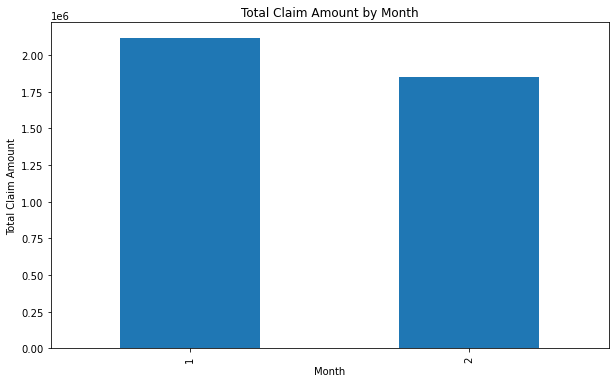

In [30]:

plt.figure(figsize=(10, 6))
df.groupby('month')['total_claim_amount'].sum().plot(kind='bar')
plt.xlabel('Month')
plt.ylabel('Total Claim Amount')
plt.title('Total Claim Amount by Month')
plt.show()

<Figure size 720x432 with 0 Axes>

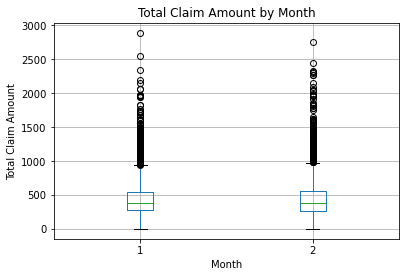

In [31]:

plt.figure(figsize=(10, 6))
df.boxplot(column='total_claim_amount', by='month')
plt.xlabel('Month')
plt.ylabel('Total Claim Amount')
plt.title('Total Claim Amount by Month')
plt.suptitle('')
plt.show()


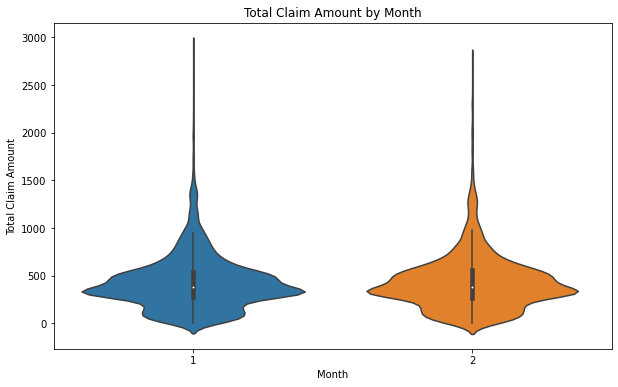

In [32]:
plt.figure(figsize=(10, 6))
sns.violinplot(x='month', y='total_claim_amount', data=df)
plt.xlabel('Month')
plt.ylabel('Total Claim Amount')
plt.title('Total Claim Amount by Month')
plt.show()


We can note that the total claim amount is a little higher on average in month 1. The maximum claim amount is also higher. 